<a href="https://colab.research.google.com/github/praveenbhat73/self_driving_car/blob/main/Behavioral_cloning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
#cloning / downloading the data set from the github !-> interprets the line as shell command
!git clone https://github.com/praveenbhat73/dataset

Cloning into 'dataset'...
remote: Enumerating objects: 12163, done.
remote: Total 12163 (delta 0), reused 0 (delta 0), pack-reused 12163
Receiving objects: 100% (12163/12163), 156.98 MiB | 17.75 MiB/s, done.
Updating files: 100% (12160/12160), done.


In [4]:
! ls dataset

driving_log.csv  IMG


In [5]:
!pip3 install imgaug

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [29]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Conv2D,MaxPooling2D,Dropout,Flatten,Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random
import tensorflow as tf

In [7]:
#datadir is dataset which is loaded in folder 
datadir='dataset'
# the dataset folder contains csv file which doesnt have columns name so column name is assigned with columns=[] 
columns=['center','left','right','steering','throttle','reverse','speed']
# function to read .csv file pd-> pandas and its set to path datadir and name is given of coulmn names
data=pd.read_csv(os.path.join(datadir,'driving_log.csv'),names=columns)
# if we remove below code we cant see full column name so pandas has inbuilt option to display.max_colwidth here -1 is set to unlimited characters width we can change number 
# to different number 
pd.set_option('display.max_colwidth',100)
#  displays first 5 rows can pass parameter as number 
data.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_382.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_670.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_724.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_792.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\left_2018_07_16_17_11_43_860.jpg,C:\Users\Amer\Desktop\new_track\IMG\right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


In [8]:
#  Now in the data in above contains file name but we need only image name 
#  below function does that part
#   function is applied on center,left,right
# path_leaf function takes data path and returns only tail part with using ntpath lib
# every path is divided into head and tail part 
# ntpath.split() func from ntpath module is used and it returns two op head and tail
# then func path_leaf retuns only tail that is updated to each center,left and right column
# head-> is path name like c:/user/.... 
# tail is filename abc.jpg
# what does ntpath module do ? 
    #  ntpath helps to modify the path of the file in os windows which comes from windows nt family {nt -> most of all windows versions}
def path_leaf(path):
  head,tail=ntpath.split(path)
  return tail
data['center']=data['center'].apply(path_leaf)
data['left']=data['left'].apply(path_leaf)
data['right']=data['right'].apply(path_leaf)
data.head()
# after using function the column shows only filename 

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


array([-0.96, -0.88, -0.8 , -0.72, -0.64, -0.56, -0.48, -0.4 , -0.32,
       -0.24, -0.16, -0.08,  0.  ,  0.08,  0.16,  0.24,  0.32,  0.4 ,
        0.48,  0.56,  0.64,  0.72,  0.8 ,  0.88,  0.96])

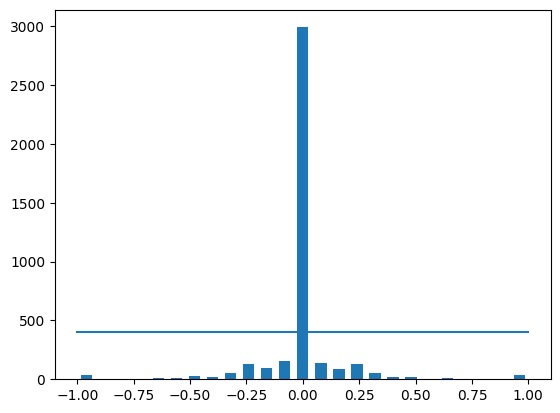

In [9]:
#  the entire range of values has to be divided into intervals and its divided into 25 and given name num_bins

num_bins=25
#  basically the threshold is applied on the histagram bcz the graph shows that car has been moved more to center 
# if we didnt put threshold then car might not take sharp turns it will be biased on straight/center line
samples_per_bin=400

# the histogram is applied on steering column with 25 as intervals and np.histogram() returns value in array bins=num_bins, hist=data[steering]
#  histogram is graphical rep of the data set -> steps -> 1st ) divide the whole value into number of intervals and count how many values come under that range 
# 
hist,bins=np.histogram(data['steering'],num_bins)
# below function is to make it 0 and its basically doubled so * 1/2
#  below is average values to make the bar center 
center=(bins[:-1]+bins[1:])*0.5

# plot grap -> bar graph of hist value - height, center-x axis with width .05
plt.bar(center,hist,width=0.05)
#  below does threshold 
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))
center

In [10]:
# len(data)
data.shape
#  contains 4053 rows and 7 columns 

(4053, 7)

In [11]:
# as some data set in the graphs are not needed basically which is above threshod 
# values above threshold might bias the machine so remove it 
# function to remove threshold 
# first loop runs upto 25 and for each bin we initiliazed with new empty list array
# second loop runs upto len(data) in steering column and checks whether the data of steering falls in the edge of the bins 
#  which helps to get the count of the data 
#  if it falls under edge append its i and shuufle list_ -> to make it rondom 
#  now list_ contains value more then 400 threshold by slicing 
#  drop that in original list 
remove_list=[]
for j in range(num_bins):
  list_=[]
  for i in range(len(data['steering'])):
    if data['steering'][i]>=bins[j] and data['steering'][i]<=bins[j+1]:
      list_.append(i)
  list_=shuffle(list_)
  list_=list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed',len(remove_list))
data.drop(data.index[remove_list],inplace=True)
print('remaining:',len(data))

removed 2590
remaining: 1463


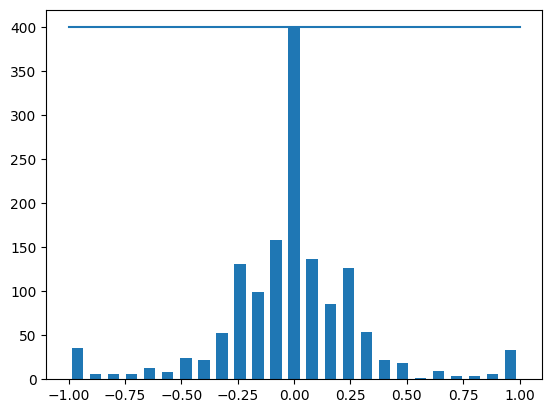

In [12]:

# this contains data within the threshold 
hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [13]:
# the below function takes two argument one is datadir where does the image files are located and another one is df -> dataframe which contains column
# it intiliazes the image_path and steering to store all the paths and steering values
# loop runs upto len of data and in each iteration data.iloc()helps to choose specific column values
# and its always 0 -> center ..
#  the path is appended in each image_path array for center ,left ..
# steering angle -> +/- .15(arbitrary values) center offset for different perspective
# at the end convert that to np.array()
# return it 
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

center      center_2018_07_16_17_11_43_724.jpg
left          left_2018_07_16_17_11_43_724.jpg
right        right_2018_07_16_17_11_43_724.jpg
steering                                   0.0
throttle                                   0.0
reverse                                    0.0
speed                                  0.62291
Name: 2, dtype: object


In [14]:
image_paths, steerings = load_img_steering(datadir + '/IMG', data)

In [15]:
print('IMAGE PATHS: ',image_paths)
print(image_paths.shape)

IMAGE PATHS:  ['dataset/IMG/center_2018_07_16_17_11_43_670.jpg'
 'dataset/IMG/left_2018_07_16_17_11_43_670.jpg'
 'dataset/IMG/right_2018_07_16_17_11_43_670.jpg' ...
 'dataset/IMG/center_2018_07_16_17_16_31_474.jpg'
 'dataset/IMG/left_2018_07_16_17_16_31_474.jpg'
 'dataset/IMG/right_2018_07_16_17_16_31_474.jpg']
(4389,)


In [16]:
print('steerings:',steerings)
print(steerings.shape)

steerings: [ 0.    0.15 -0.15 ...  0.    0.15 -0.15]
(4389,)


In [17]:
# train test split from sklearn used to split the data into train and test for to make data fit and test
# test_size =.2 its always less than train data 
#  random state is used to randomly shuffle the tarin and test data 
#  and random state is used to help randomly choose train and test data-> each time code run shuffle happens  
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)

print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 3511
Valid Samples: 878


Text(0.5, 1.0, 'Validation graph plot')

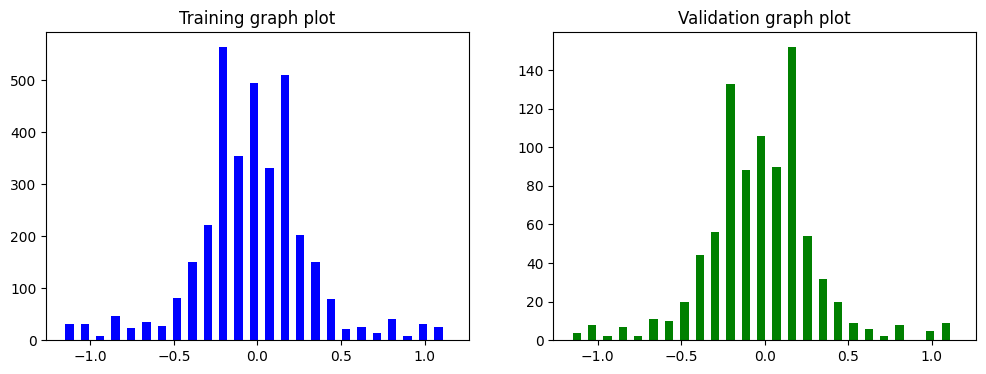

In [18]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training graph plot')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='green')
axes[1].set_title('Validation graph plot')
# the above code uses matplot lib to plot the grap 
# it creates two subplots of width = 12 inches ,height=4 inches
# axes -> reps array of subplots basically individual subplot 


Text(0.5, 1.0, 'Zoomed Image')

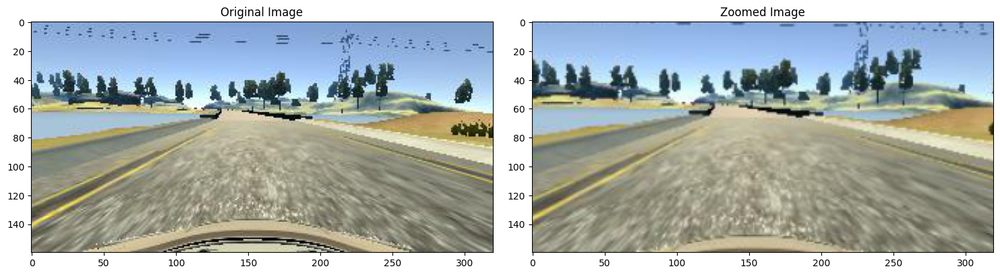

In [19]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

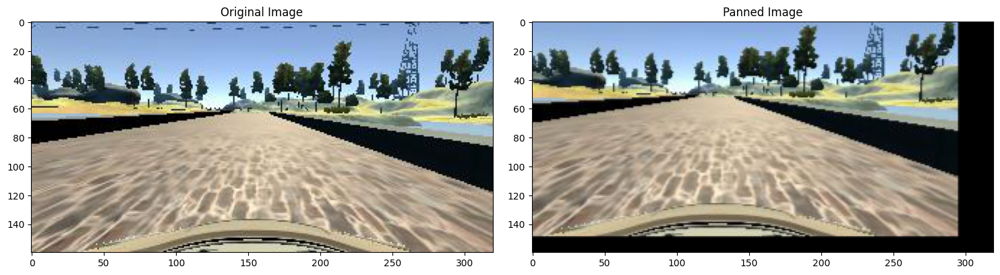

In [20]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

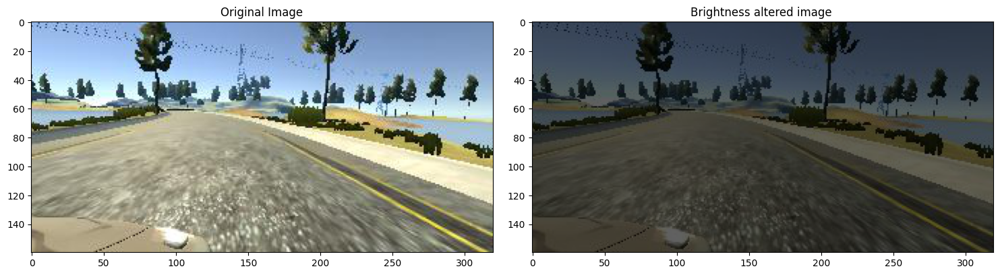

In [21]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
 
axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.026239000000000012')

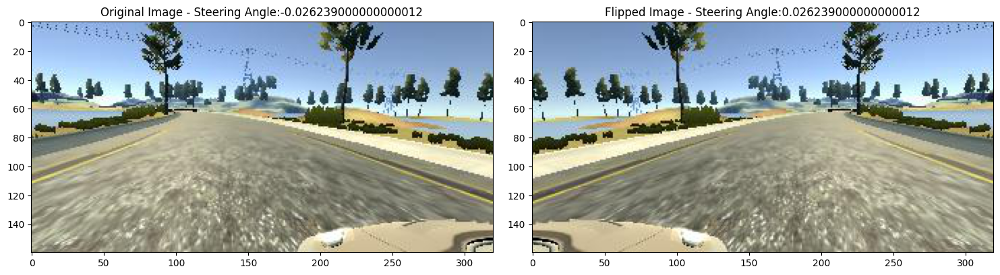

In [22]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]
 
 
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))
 
axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

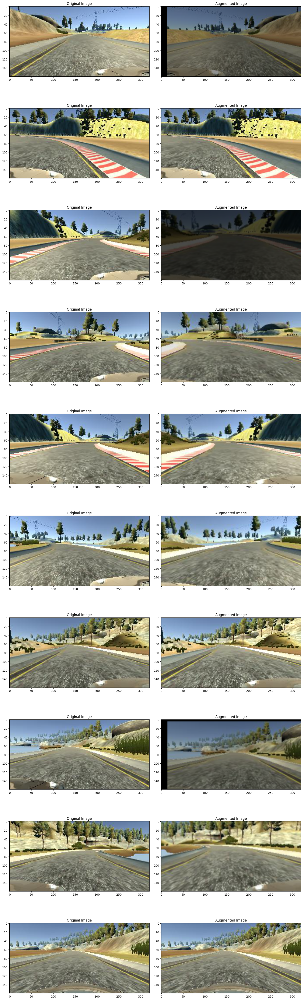

In [23]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    
    return image, steering_angle
ncol = 2
nrow = 10
 
fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()
 
for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]
    
  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)
    
  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")
  
  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [24]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

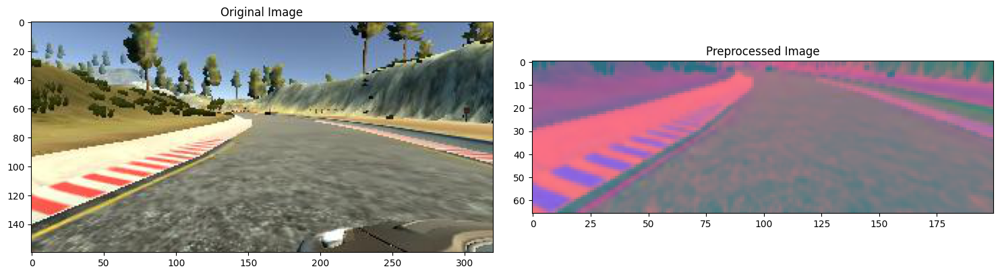

In [25]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

Text(0.5, 1.0, 'Validation Image')

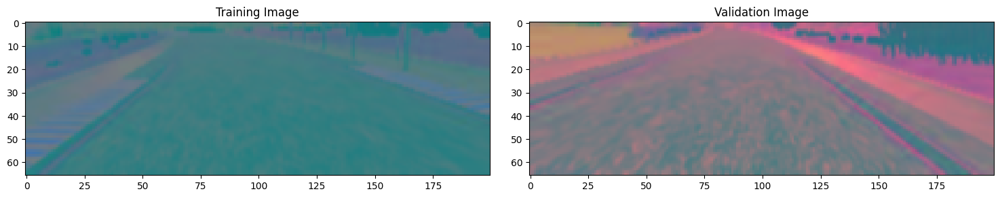

In [26]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
  
  while True:
    batch_img = []
    batch_steering = []
    
    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)
      
      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])
     
      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]
      
      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))  
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))
 
fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
 
axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')
 
axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [27]:
!nvidia-smi

Sun Apr 23 19:03:20 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   44C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [30]:
def nvidia_model():
  model = Sequential()
  model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Conv2D(64, (5, 5), activation='elu'))
  # model.add(Conv2D(64, (3,3), activation='elu'))
#   model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

model = nvidia_model()
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 31, 98, 24)        1824      
                                                                 
 conv2d_5 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_6 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_7 (Conv2D)           (None, 1, 18, 64)         76864     
                                                                 
 flatten_1 (Flatten)         (None, 1152)              0         
                                                                 
 dense_4 (Dense)             (None, 100)               115300    
                                                                 
 dense_5 (Dense)             (None, 50)               

In [31]:
history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

<ipython-input-31-c6c3380b9281>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(batch_generator(X_train, y_train, 100, 1),


Epoch 1/10
300/300 [==============================] - 163s 503ms/step - loss: 0.1611 - val_loss: 0.0558
Epoch 2/10
300/300 [==============================] - 150s 502ms/step - loss: 0.0754 - val_loss: 0.0497
Epoch 3/10
300/300 [==============================] - 147s 492ms/step - loss: 0.0648 - val_loss: 0.0469
Epoch 4/10
300/300 [==============================] - 145s 486ms/step - loss: 0.0570 - val_loss: 0.0379
Epoch 5/10
300/300 [==============================] - 142s 476ms/step - loss: 0.0525 - val_loss: 0.0339
Epoch 6/10
300/300 [==============================] - 147s 492ms/step - loss: 0.0494 - val_loss: 0.0303
Epoch 7/10
300/300 [==============================] - 148s 496ms/step - loss: 0.0460 - val_loss: 0.0296
Epoch 8/10
300/300 [==============================] - 148s 495ms/step - loss: 0.0436 - val_loss: 0.0307
Epoch 9/10
300/300 [==============================] - 147s 492ms/step - loss: 0.0419 - val_loss: 0.0308
Epoch 10/10
300/300 [==============================] - 145s 486m

Text(0.5, 0, 'Epoch')

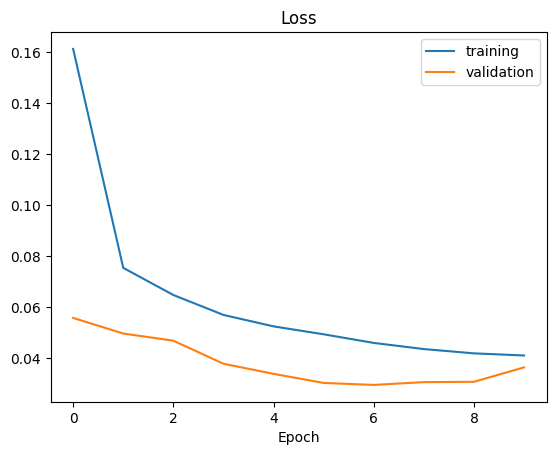

In [32]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [33]:
model.save('model.h5')
from google.colab import files
files.download('model.h5')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>